# BNB: Metadata and Gene Expression of Cells Selected by Region Sketch
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import geopandas as gpd
from shapely.geometry import Point
import celldega as dega
from celldega.pre.boundary_tile import  _get_name_mapping


# Data initialization

In [6]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
use_int_index = True

tech = 'Xenium'

DATA_DIR = f'data/raw'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'data/landscape_files/{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [7]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_pixel.parquet')
display(gdf_pixel)

gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')
display(gdf_micron)


,area,roi,color,geometry
0,4.156231e+06,region_1,"[100.2288579061643, 26.32346218685073, 77.2277...","POLYGON ((7511.632 7292.414, 8288.303 7648.697..."
1,6.983694e+07,region_2,"[30.139626666484997, 30.933845221577275, 65.92...","POLYGON ((19343.772 289.663, 29487.958 1289.01..."


,area,roi,color,geometry
0,1.876798e+05,region_1,"[100.2288579061643, 26.32346218685073, 77.2277...","POLYGON ((1596.222 1549.638, 1761.265 1625.348..."
1,3.153575e+06,region_2,"[30.139626666484997, 30.933845221577275, 65.92...","POLYGON ((4110.552 61.553, 6266.192 273.915, 6..."


## Transform points from pixel space to micron space

In [16]:
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{path_landscape_files}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = gdf_join['name'].map(df_cluster['cluster'])



if use_int_index: # For older version landscapes files, set use_int_index to False
    # Convert string index to integer index
    cell_str_to_int_mapping = _get_name_mapping(
        path_landscape_files,
        layer='boundary',
        )
    gdf_join['name'] = gdf_join['name'].map(cell_str_to_int_mapping)

gene_list = ['TP53', 'MUC16']
if dataset_name == 'Xenium_V1_human_Pancreas_FFPE_outs':
    gene_list = ['EPCAM']

for gene in gene_list:
    df_gene = pd.read_parquet(f"{path_landscape_files}/cbg/{gene}.parquet")
    df_gene['name'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='name', how='left')
    
gdf_join_micron = dega.pre.coordinate_transform(gdf_join, path_landscape_files, "pixel_to_micron")

/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


## Cluster of region selected cells

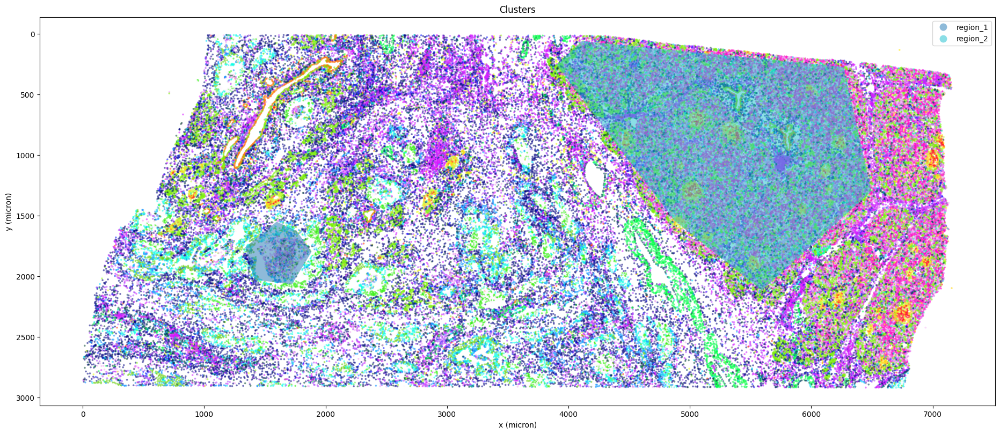

In [ ]:

fig, ax = plt.subplots(figsize=(20,8))

gdf_join_micron.plot(
    ax=ax,
    column='cluster',
    aspect=1,
    legend=True,
    alpha=0.4,
    cmap='gist_ncar',
    markersize=3,
)
gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.5)

# Adjust the plot
ax.invert_yaxis()
plt.title("Clusters")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
plt.show()


## Gene expression of region selected cells

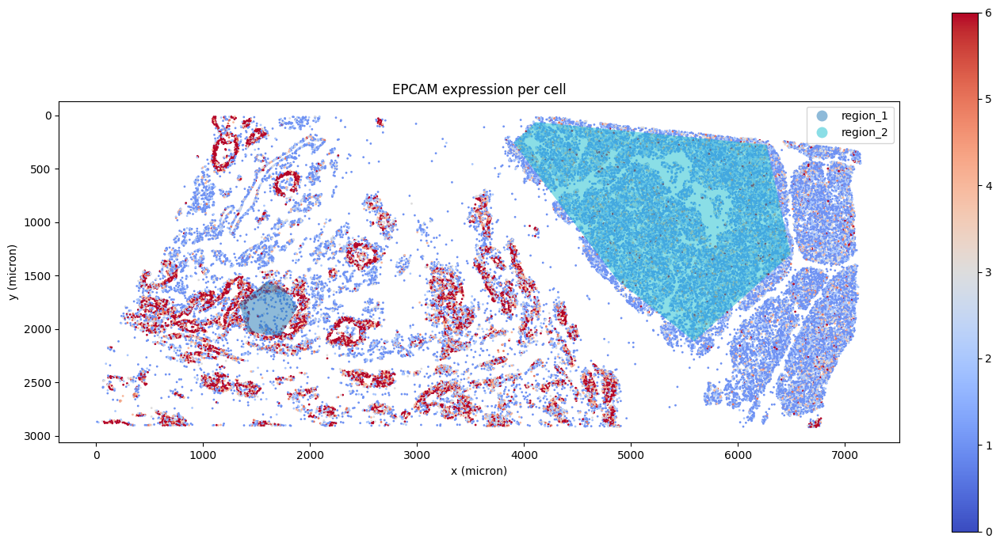

In [20]:
for gene in gene_list:

    fig, ax = plt.subplots(figsize=(14, 7))
    gdf_join_micron.plot(ax=ax, aspect=1, column=gene, legend=True, vmin=0, vmax=6, cmap='coolwarm', s=1)
    gdf_micron.plot(ax=ax, column='roi', legend=True, cmap='tab10', alpha=0.5)

    ax.invert_yaxis()
    plt.title(f"{gene} expression per cell")
    plt.tight_layout()
    plt.xlabel('x (micron)')
    plt.ylabel('y (micron)')
    plt.show()